## Regresión logística multiclase

[Curso de Regresión Logística con Python y scikit-learn](platzi.com/reglog)

## Importar librerías

In [57]:
# Import packages
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from  sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix,accuracy_score, ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler
sns.set()

## Carga de datos

In [58]:
df = pd.read_csv('Dry_Bean.csv')

In [59]:
df.head(5)

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [60]:
df.shape

(13611, 17)

In [61]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [62]:
df.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860154,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


In [36]:
df.Class.unique() # Estas son las clases de frijol

array(['SEKER', 'BARBUNYA', 'BOMBAY', 'CALI', 'HOROZ', 'SIRA', 'DERMASON'],
      dtype=object)

## Drop duplicates

In [63]:
df.drop_duplicates(inplace=True) # Eliminación de valores duplicados

In [64]:
df.shape  

(13543, 17)

Se puede observar como se eliminaron 68 registros duplicados

## Manejo de datos nulos

In [65]:
df.isnull().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

Se puede observar que no se encuentran valores nulos

## undersampling

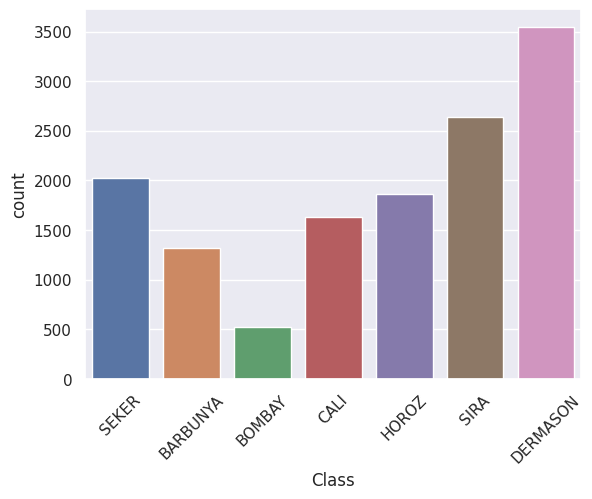

In [66]:
sns.countplot(data=df,
              x='Class')
plt.xticks(rotation=45)
plt.show()

Se puede observar como las clases están desbalanceadas.

In [67]:
from imblearn.under_sampling import RandomUnderSampler
undersampler = RandomUnderSampler(random_state=43)

In [73]:
X = df.drop('Class',axis=1)
y = df.Class

0           SEKER
1           SEKER
2           SEKER
3           SEKER
4           SEKER
           ...   
13606    DERMASON
13607    DERMASON
13608    DERMASON
13609    DERMASON
13610    DERMASON
Name: Class, Length: 13543, dtype: object

In [74]:
X_over, y_over = undersample.fit_resample(X,y)

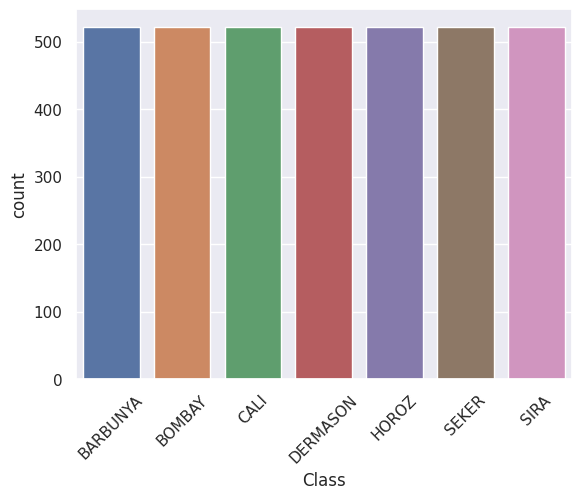

In [78]:
sns.countplot(x = y_over)
plt.xticks(rotation=45)
plt.show()

Se puede observar que las clases se encuentran ahora balanceadas

In [79]:
df.shape

(13543, 17)

In [80]:
X_over.shape

(3654, 16)

## Conversión a numéricos

In [81]:
list(np.unique(y_over))

['BARBUNYA', 'BOMBAY', 'CALI', 'DERMASON', 'HOROZ', 'SEKER', 'SIRA']

In [84]:
y_over.replace(['BARBUNYA', 'BOMBAY', 'CALI', 'DERMASON', 'HOROZ', 'SEKER', 'SIRA'],[1,2,3,4,5,6,7],inplace=True)

In [85]:
list(np.unique(y_over))

[1, 2, 3, 4, 5, 6, 7]

## Análisis exploratorio de datos

### Corrrelations

In [87]:
df_dea = X_over.copy(deep=True)
df_dea['Class'] = y_over

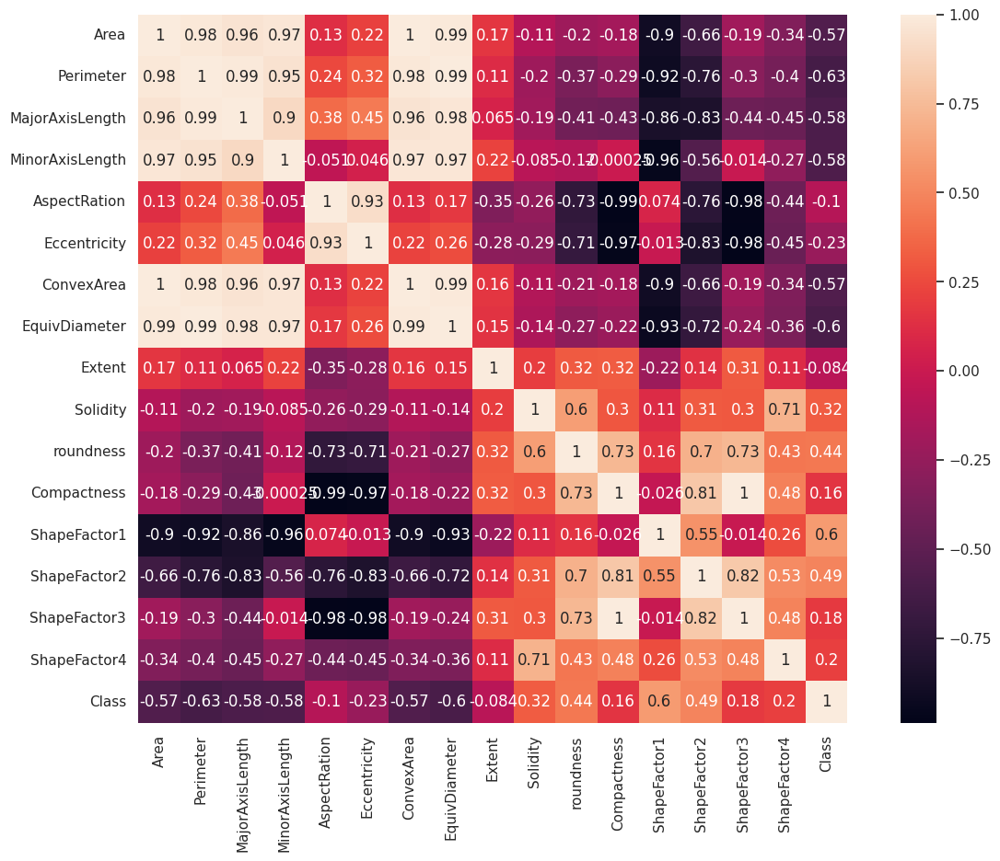

In [94]:
plt.figure(figsize=(15,10))
sns.heatmap(df_dea.corr(),
            annot=True,
            square=True)
plt.show()

In [96]:
X_over.drop(['ConvexArea','EquivDiameter'],axis=1,inplace=True)


## Visualización de datos

/home/nico9779/anaconda3/envs/regresion_logistica/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


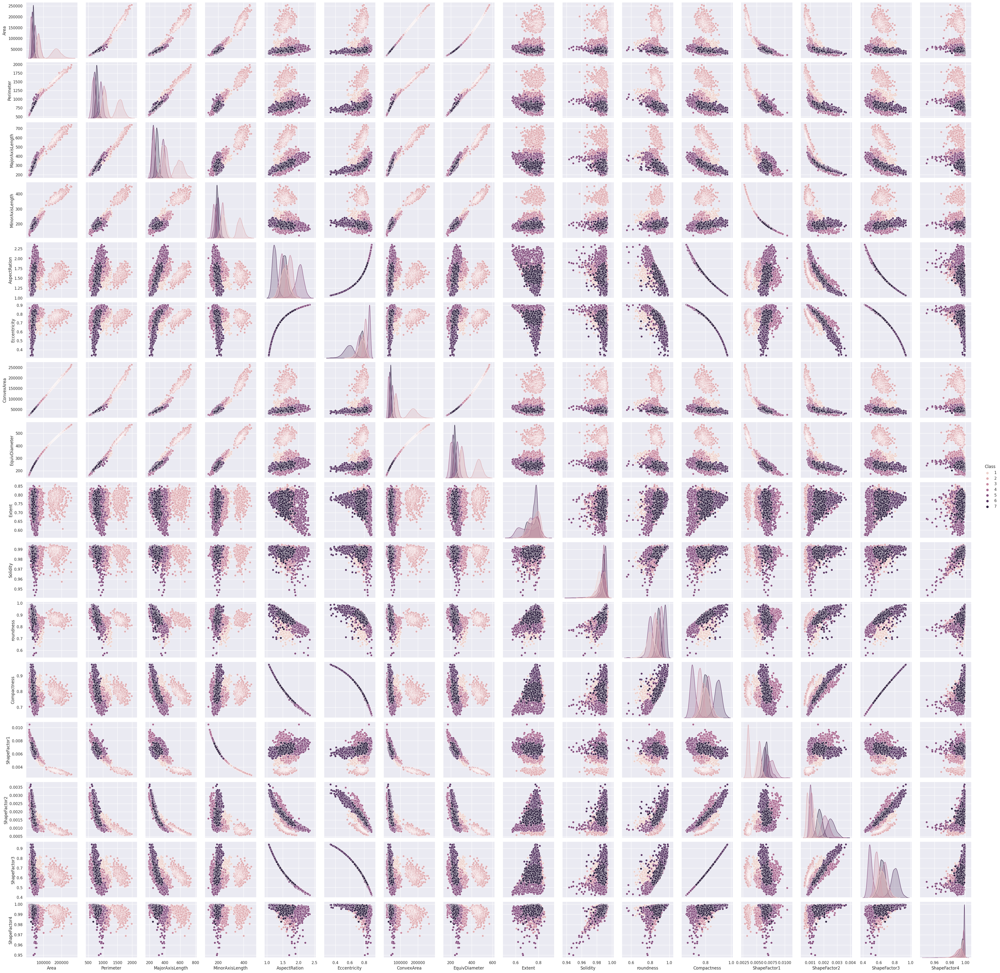

In [98]:
sns.pairplot(df_dea,hue='Class')

## Split y escalamiento de datos

In [135]:
X_train, X_test, y_train, y_test = train_test_split(X_over,y_over,test_size=0.2,random_state=42,shuffle=True)

In [138]:
st_x = StandardScaler()
X_train = st_x.fit_transform(X_train)
X_test = st_x.fit_transform(X_test)

## Modelo multiclase

In [139]:
def logistic_model(C,solver_,multiclass_):
    logistic_regression_model = LogisticRegression(random_state=42,solver=solver_,multi_class=multiclass_,n_jobs=1,C=C)
    return logistic_regression_model
    

In [140]:
model = logistic_model(1,'saga','multinomial')
model.fit(X_train,y_train)
predictions = model.predict(X_test)
print(confusion_matrix(y_test,predictions))
print(accuracy_score(y_test,predictions))

[[114   0   8   0   1   2   3]
 [  0  98   0   0   0   0   0]
 [  2   0 100   0   0   0   1]
 [  0   0   0  95   0   6   4]
 [  0   0   4   1  91   0   0]
 [  2   0   0   0   0  86   3]
 [  0   0   1   6   6   0  97]]
0.9316005471956225


/home/nico9779/anaconda3/envs/regresion_logistica/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


In [156]:
multiclass = ['ovr','multinomial']
solver_list = ['liblinear','newton-cg','lbfgs','sag','saga']
scores = []
params = []
for i in multiclass:
    for j in solver_list:
        try:
            model = logistic_model(1,j,i)
            model.fit(X_train,y_train)
            predictions = model.predict(X_test)
            params.append(i +  ' '  + j)
            accuracy = accuracy_score(y_test,predictions)
            scores.append(accuracy)
        except:
            None

/home/nico9779/anaconda3/envs/regresion_logistica/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/nico9779/anaconda3/envs/regresion_logistica/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/nico9779/anaconda3/envs/regresion_logistica/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/nico9779/anaconda3/envs/regresion_logistica/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/nico9779/anaconda3/envs/regresion_logistica/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_ite

In [ ]:
multiclass = ['ovr','multinomial']
solver_list = ['liblinear', 'newton-cg', 'lbfgs', 'sag', 'saga']
scores = []
params=[]
for i in multiclass:
    for j in solver_list:
        try:
            model = logistic_model(1,j,i)
            model.fit(X_train, y_train)
            predictions = model.predict(X_test)
            params = pd.concat(params,)
            accuraccy = accuracy_score(y_test,predictions)
            scores.append(accuraccy)
        except:
            None    

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/lin

## Evaluación de resultados

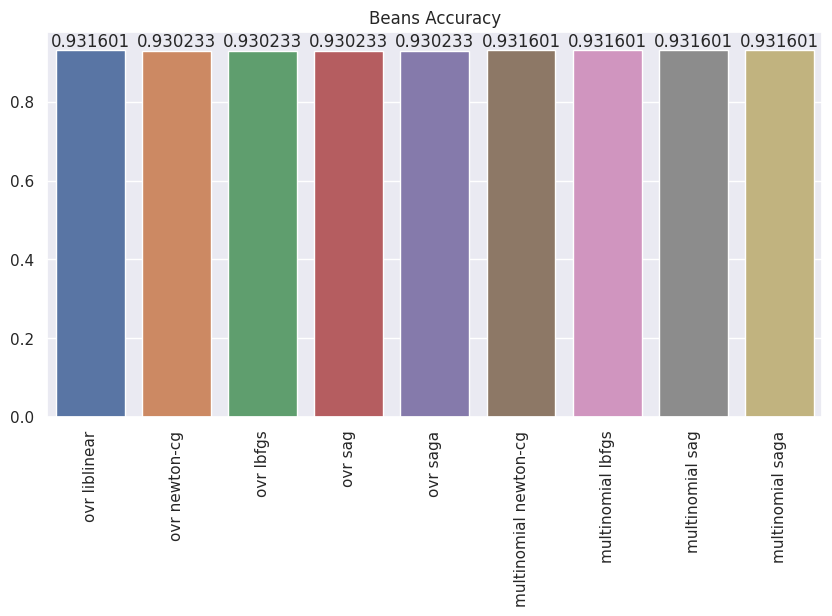

In [171]:
fig, ax1 = plt.subplots(figsize=(10,5))
ax = sns.barplot(x=params,y=scores)
ax.set_title('Beans Accuracy')
ax.set_xticklabels(labels = ax.get_xticklabels(),rotation=90)
ax.bar_label(ax.containers[0])
plt.show()


Se puede observar que el metodo que presenta mejor accuracy es multinomial newton-cg, por lo cual este será elegido para realizar la regresion multinomial

In [177]:
model = logistic_model(1,solver_='newton-cg',multiclass_='multinomial')
model.fit(X_train,y_train)
predictions = model.predict(X_test)
print(confusion_matrix(y_test,predictions))
print(accuracy_score(y_test,predictions))

[[114   0   8   0   1   2   3]
 [  0  98   0   0   0   0   0]
 [  2   0 100   0   0   0   1]
 [  0   0   0  95   0   6   4]
 [  0   0   4   1  91   0   0]
 [  2   0   0   0   0  86   3]
 [  0   0   1   6   6   0  97]]
0.9316005471956225


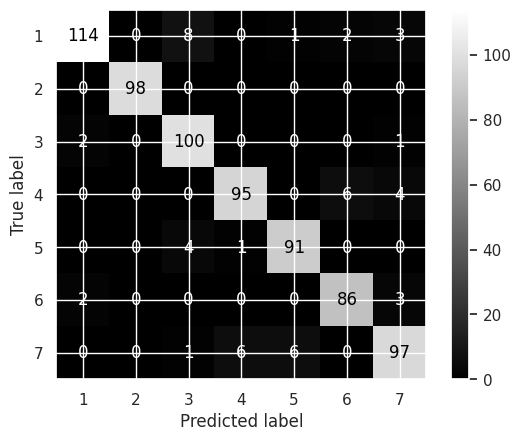

In [182]:
cm = confusion_matrix(y_test, predictions,labels=model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=model.classes_)
disp.plot(cmap='gray')